In [33]:
import cv2
import pandas as pd
import numpy as np
import os
import glob
import torch
import torch.nn as nn
from torchvision.utils import make_grid
from collections import OrderedDict
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms, models
from torchvision.models import resnet50, ResNet50_Weights
from torch.utils.data import Dataset, DataLoader
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
import numpy as np
import io
from skimage.color import rgb2hsv

In [5]:
!wget "https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_GroundTruth.zip"
!wget "https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_Input.zip"
!wget "https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Validation_GroundTruth.zip"
!wget "https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Validation_Input.zip"

--2024-04-09 00:05:32--  https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_GroundTruth.zip
Resolving isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)... 3.5.25.164, 54.231.233.81, 52.216.52.65, ...
Connecting to isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)|3.5.25.164|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 36681 (36K) [application/zip]
Saving to: ‘ISIC2018_Task3_Training_GroundTruth.zip’

ISIC2018_Task3_Trai 100%[===================>]  35.82K  --.-KB/s    in 0.02s   

2024-04-09 00:05:32 (1.76 MB/s) - ‘ISIC2018_Task3_Training_GroundTruth.zip’ saved [36681/36681]

--2024-04-09 00:05:32--  https://isic-challenge-data.s3.amazonaws.com/2018/ISIC2018_Task3_Training_Input.zip
Resolving isic-challenge-data.s3.amazonaws.com (isic-challenge-data.s3.amazonaws.com)... 3.5.25.164, 54.231.233.81, 52.216.52.65, ...
Connecting to isic-challenge-data.s3.amazonaws.com (isic-challenge-data

In [6]:
!unzip ISIC2018_Task3_Training_GroundTruth
!unzip ISIC2018_Task3_Training_Input
!unzip ISIC2018_Task3_Validation_GroundTruth
!unzip ISIC2018_Task3_Validation_Input

Streaming output truncated to the last 5000 lines.
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029524.jpg  
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029525.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029526.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029527.jpg  
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029528.jpg  
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029529.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029530.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029531.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029532.jpg  
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029533.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029534.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029535.jpg  
 extracting: ISIC2018_Task3_Training_Input/ISIC_0029536.jpg  
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029537.jpg  
  inflating: ISIC2018_Task3_Training_Input/ISIC_0029538.jpg  
  inflating: ISIC20

In [7]:
train_df = pd.read_csv('/content/ISIC2018_Task3_Training_GroundTruth/ISIC2018_Task3_Training_GroundTruth.csv')
classes = train_df.columns[1:]
train_df['label'] = train_df.iloc[:, 1:].idxmax(axis=1)

validation_df = pd.read_csv('/content/ISIC2018_Task3_Validation_GroundTruth/ISIC2018_Task3_Validation_GroundTruth.csv')
validation_df['label'] = validation_df.iloc[:, 1:].idxmax(axis=1)


train_dir = '/content/ISIC2018_Task3_Training_Input'
valid_dir = '/content/ISIC2018_Task3_Validation_Input'

Below function checks the colour distribution on the RGB palette to determine which palettes to use in preprocessing.

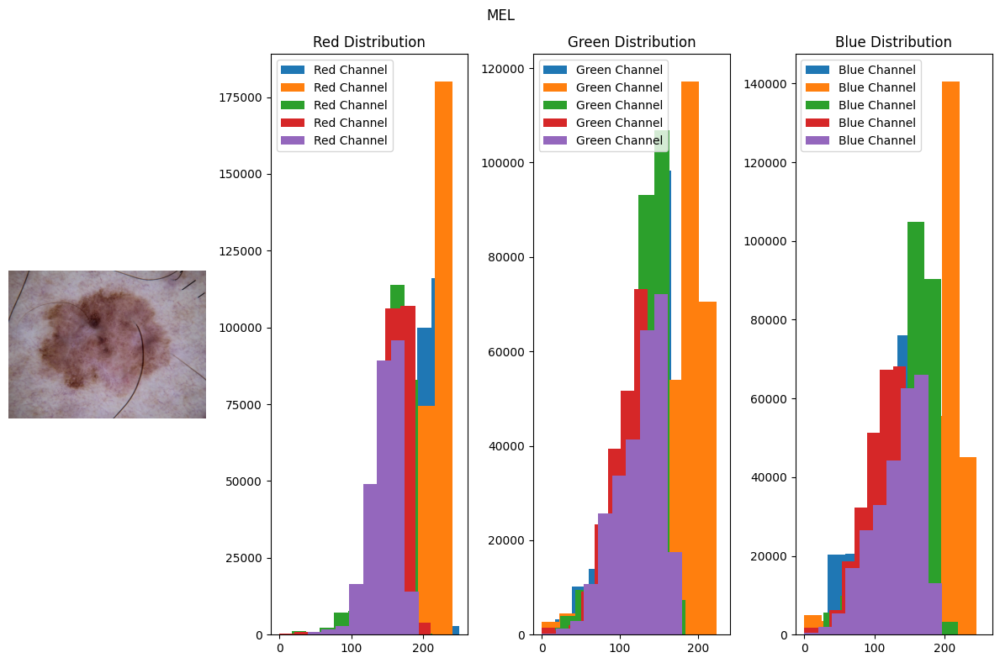

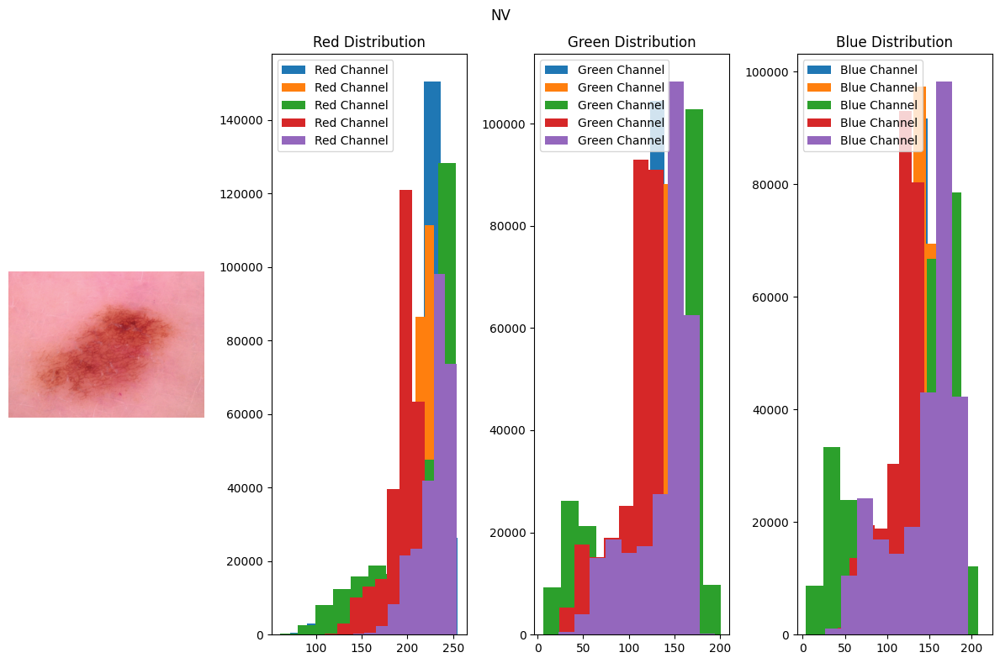

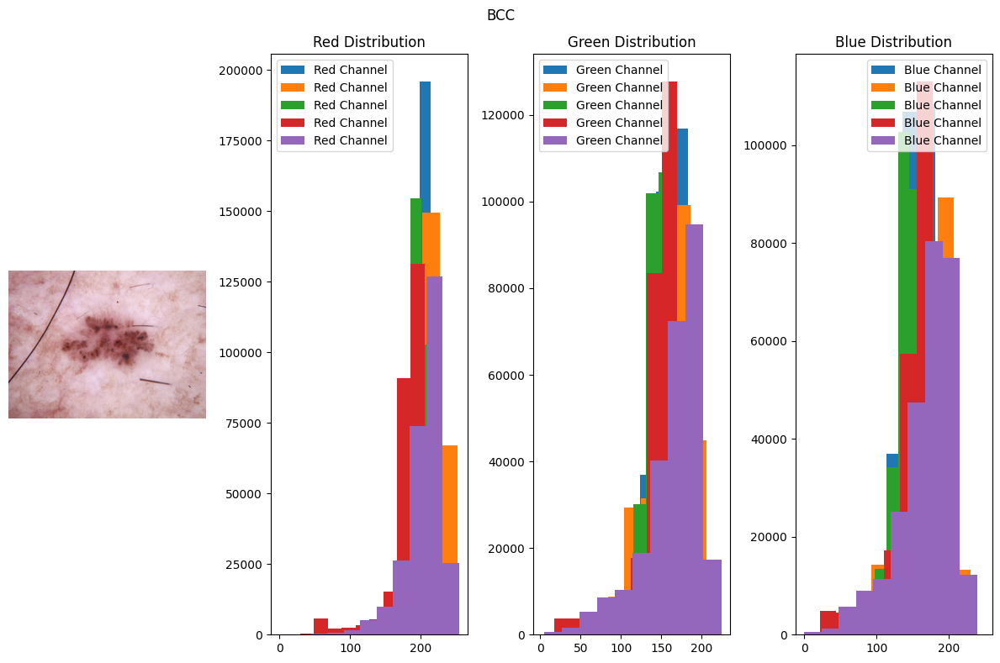

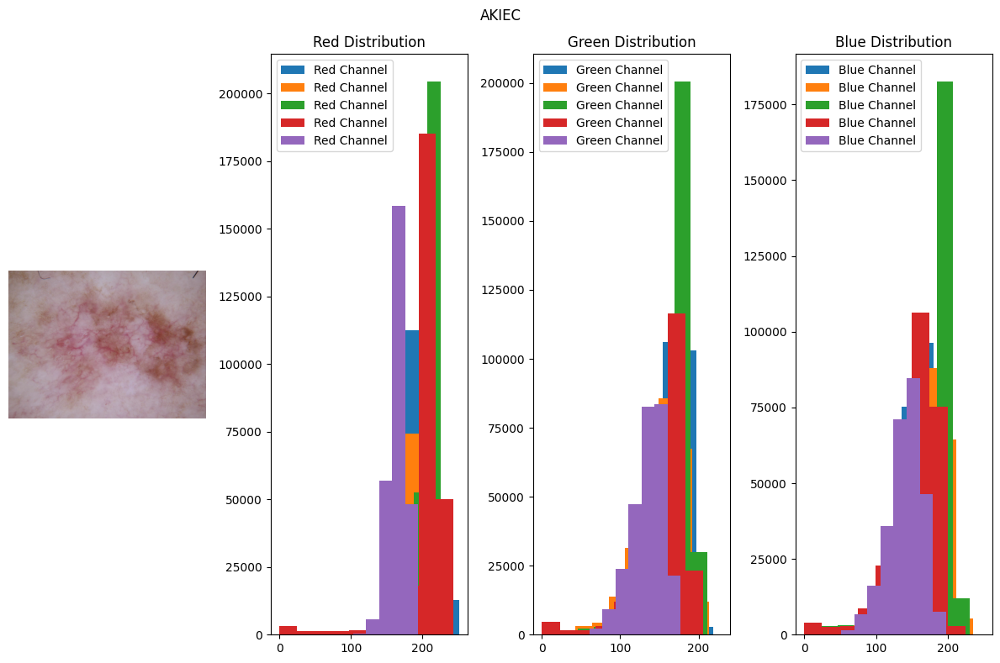

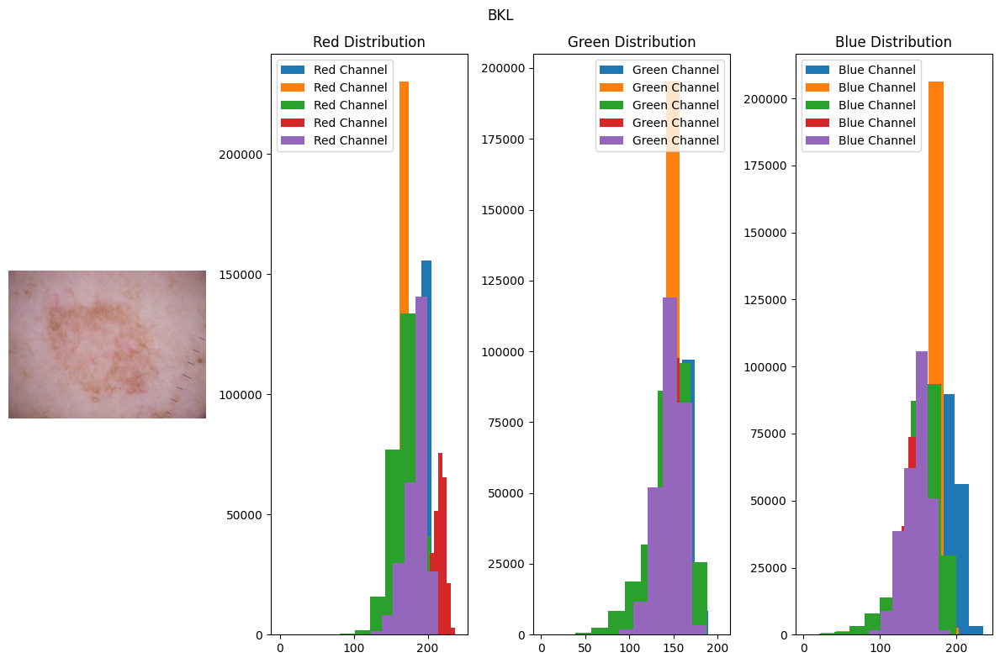

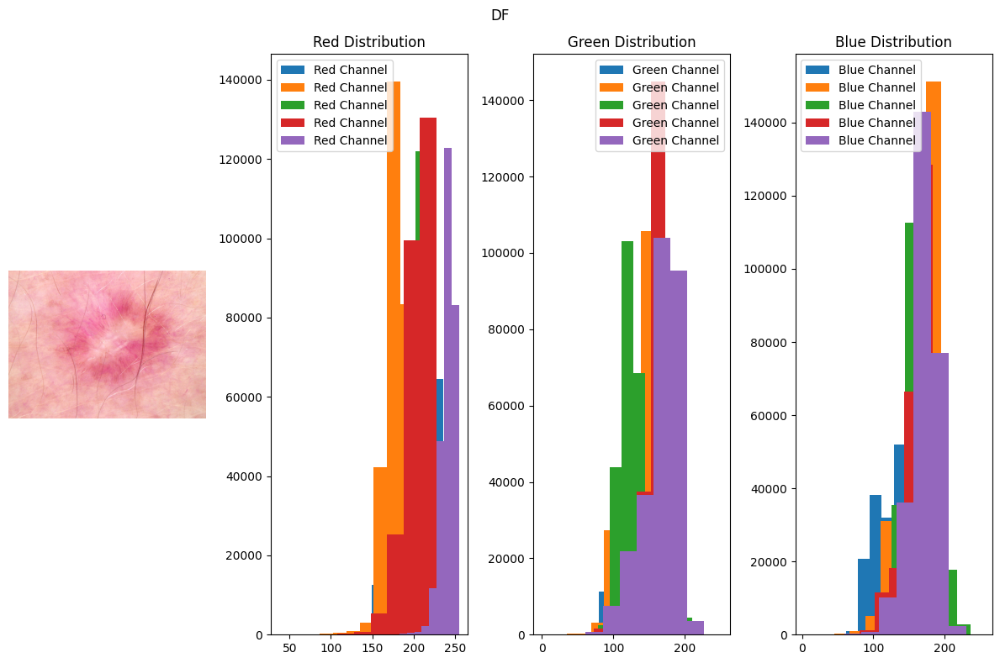

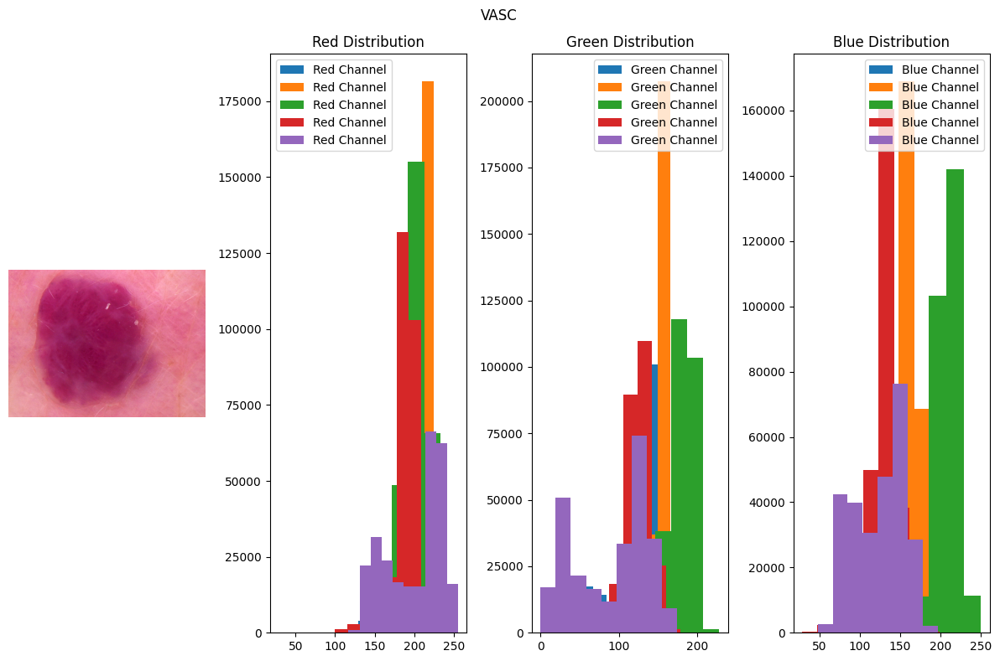

In [28]:
def plot_data_with_rgb_analysis(data):
  # Display 5 images from each class
  for class_name in classes:
    # Filter the DataFrame to get 5 image data for the current class
    class_images_data = data[data[class_name] == 1.0]['image'].values[:5]

    # Create a subplot for each class (image + RGB plots)
    fig, (ax_image, ax_red, ax_green, ax_blue) = plt.subplots(1, 4, figsize=(12, 8))
    fig.suptitle(class_name)

    for i, image_name in enumerate(class_images_data):
      image_path = os.path.join(train_dir, image_name + '.jpg')
      image = Image.open(image_path)
      image_array = np.array(image)
      ax_image.imshow(image)
      ax_image.axis('off')

      # Extract RGB channels
      red, green, blue = image_array.T

      # Plot RGB channel distributions (optional customization)
      ax_red.hist(red.flatten(),bins=10, label='Red Channel')
      ax_green.hist(green.flatten(), bins=10, label='Green Channel')
      ax_blue.hist(blue.flatten(), bins=10, label='Blue Channel')

      # Customize plots (optional)
      ax_red.legend()
      ax_green.legend()
      ax_blue.legend()
      ax_red.set_title('Red Distribution')
      ax_green.set_title('Green Distribution')
      ax_blue.set_title('Blue Distribution')

    plt.tight_layout()  # Adjust layout for better spacing
    plt.show()
plot_data_with_rgb_analysis(train_df)

Based on the plots, a YUV and BGR distribution was chosen to see if the colour palette improves Ml model metrics

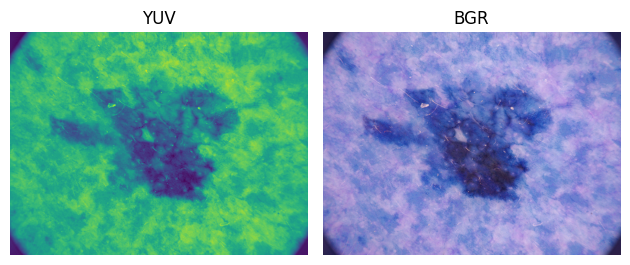

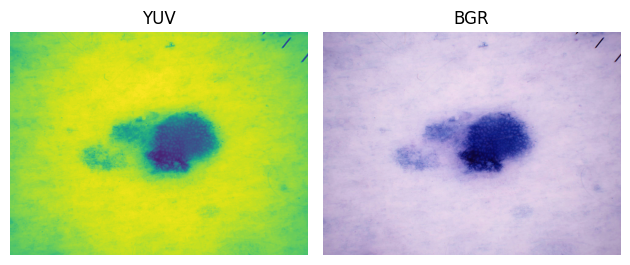

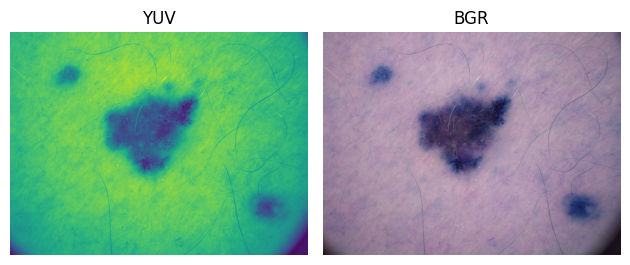

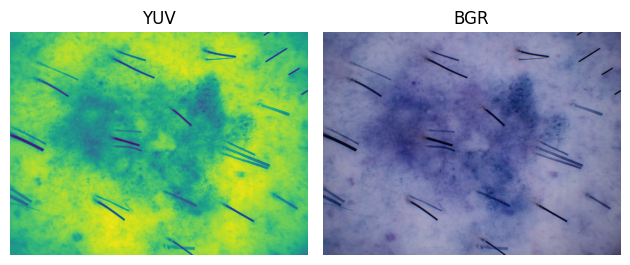

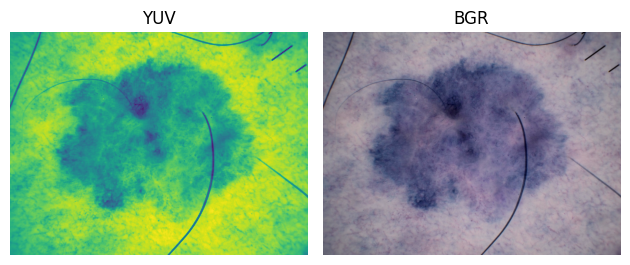

...

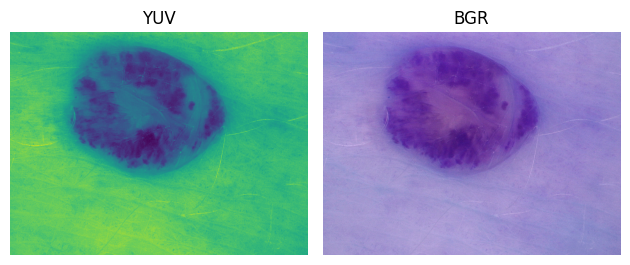

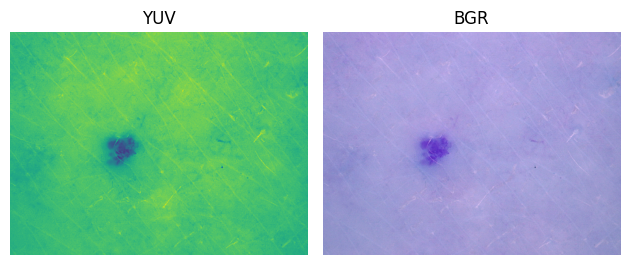

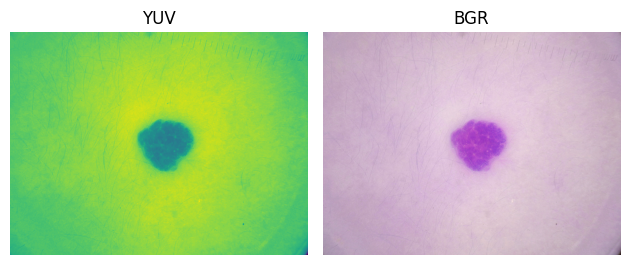

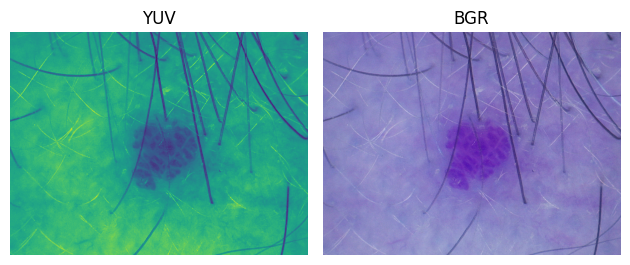

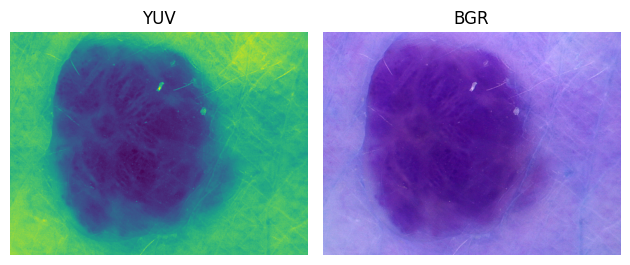

In [35]:
def colour_preprocess(data):
  # Display 5 images from each class
  for class_name in classes:
    # Filter the DataFrame to get 5 image data for the current class
    class_images_data = data[data[class_name] == 1.0]['image'].values[:5]

    for i, image_name in enumerate(class_images_data):
      image_path = os.path.join(train_dir, image_name + '.jpg')

      # Load image with OpenCV for YUV conversion and pixelation
      img = cv2.imread(image_path)

      # Convert to YUV, extract Y channel, and increase contrast
      yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
      Y, _, _ = cv2.split(yuv)
      max_value = 255  # Adjust for desired contrast level
      Y = cv2.normalize(Y, None, alpha=0, beta=max_value, norm_type=cv2.NORM_MINMAX)

      # Merge back to YUV, convert to BGR, and create a PIL Image for display
      bgr = cv2.cvtColor(yuv, cv2.COLOR_YUV2BGR)
      image_yuv = Image.fromarray(Y)
      image_bgr = Image.fromarray(bgr)

      # Create a figure with two subplots
      fig, (ax_yuv, ax_bgr) = plt.subplots(1, 2)

      # Display the YUV and BGR images side by side
      ax_yuv.imshow(image_yuv)
      ax_yuv.axis('off')
      ax_yuv.set_title('YUV')

      ax_bgr.imshow(image_bgr)
      ax_bgr.axis('off')
      ax_bgr.set_title('BGR')

      plt.tight_layout()
      plt.show()

colour_preprocess(train_df)